# Intro

Image segmentation has various applications in industry, but particularly in the medical industry the possiblities for automated diagnoses and cheaper medical imaging programs motivate researchers to invest in producing robust image segmentation models for human tissue. In this notebook we explore various model architectures, optimization algorithms, and preprocessing techniques with experiments in order to evaluate their perforamnce on the Brain MRI Segmentation Dataset with the goal of detecting and segmenting gliomas present in the MRIs.

In [1]:
import numpy as np 
import pandas as pd
import cv2
import torch
import torchvision
from torchvision import utils as vutils
from torchvision import transforms

from torch import nn
from torch.nn import functional as F
from torch.utils import data
from torch.optim import SGD, Adam
from PIL import Image
import matplotlib.pyplot as plt
import os
from statistics import mean

# EDA

Let's first get an idea of the data and make sure there are no edge cases that we will have to deal with. It will also be useful to understand the degree of class imbalance in the data as we can tailor our training techniques to this.

In [2]:
'''
Extract number of positive vs negative samples (where negative samples have an all-zero mask)
Check for files without corresponding mask and vice versa
'''
root = '/kaggle/input/lgg-mri-segmentation/kaggle_3m/'

no_mask = 0
no_mask_files = []
no_file = 0
no_files = []
num_empty_masks = 0
num_nonempty_masks = 0

S = 3 # number of pos/neg samples to take
empty_mask_samples = []
nonempty_mask_samples = []

img_dimensions = []
msk_dimensions = []

n_files = 0
for directory in [os.path.join(root,x) for x in os.listdir(root) if os.path.isdir(os.path.join(root, x))]:
    for file in os.listdir(directory):
        n_files += 1
        img_dimensions.append(np.array(cv2.imread(os.path.join(directory, file))).shape)
        #count files with no mask
        if 'mask' not in file:
            #check if mask exists
            mask_path = os.path.join(directory, file[:file.find('.tif')]+'_mask.tif')
            if not os.path.exists(mask_path):
                no_mask += 1
                no_mask_files.append(os.path.join(directory, file))
        else:
            msk_dimensions.append(np.array(cv2.imread(os.path.join(directory, file), cv2.IMREAD_UNCHANGED)).shape)
            #count masks with no file
            f_path = os.path.join(directory, file[:file.find('mask')-1]+'.tif')
            #check if file exists
            if not os.path.exists(f_path):
                no_file += 1
                no_files.append(os.path.join(directory, file))
                
            #check if mask is empty
            j = np.max(cv2.imread(os.path.join(directory, file), cv2.IMREAD_UNCHANGED))
            if j > 0:
                num_nonempty_masks += 1
                if len(nonempty_mask_samples) < S:
                    nonempty_mask_samples.append(os.path.join(directory, file))
            else:
                num_empty_masks += 1
                if len(empty_mask_samples) < S:
                    empty_mask_samples.append(os.path.join(directory, file))

Luckily as seen below the image dimensions for this dataset are uniform so we will not have to wrangle the data with respect to this attribute.

In [3]:
#check variance in dimensions
print('Image Dimensions')
print(len(set(img_dimensions)))
print(set(img_dimensions))
print('Mask Dimensions')
print(len(set(msk_dimensions)))
print(set(msk_dimensions))

Image Dimensions
1
{(256, 256, 3)}
Mask Dimensions
1
{(256, 256)}


Luckily no files are missing their counterpart either, as some files have a completely negative diagnoses it may be a problem to train our segmentation model on an unbalanced dataset like this. A few approaches can be taken to deal with this:

1. We balance our sampling during training time to avoid biasing the segmentation algorithm, this could still be faulty
2. We employ a classifier to make a diagnoses (positive/negative) and only segment positive diagnoses

In this notebook we will assume the use of the second approach - sometimes practitioners will make this classifier another output layer of the segmenter so that they can share important features, other times we make use of transfer learning and train something like ResNet50 in order to create a robust classifier to support the segmenter. Here we out goal is mainly to increase the quality of the segmentation, so we will just train the segmenter on only positive samples.

#No Mask: 0
#Mask w/ No File: 0
#Total Files 7858


<BarContainer object of 2 artists>

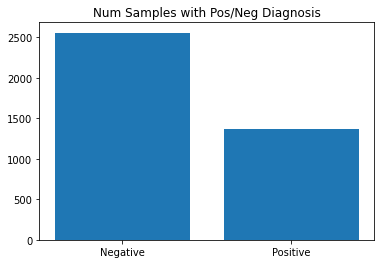

In [4]:
print(f'#No Mask: {no_mask}')
print(f'#Mask w/ No File: {no_file}')
print(f'#Total Files {n_files}')

plt.figure()
plt.title('Num Samples with Pos/Neg Diagnosis')
plt.bar([0,1], [num_empty_masks, num_nonempty_masks], tick_label=['Negative', 'Positive'])

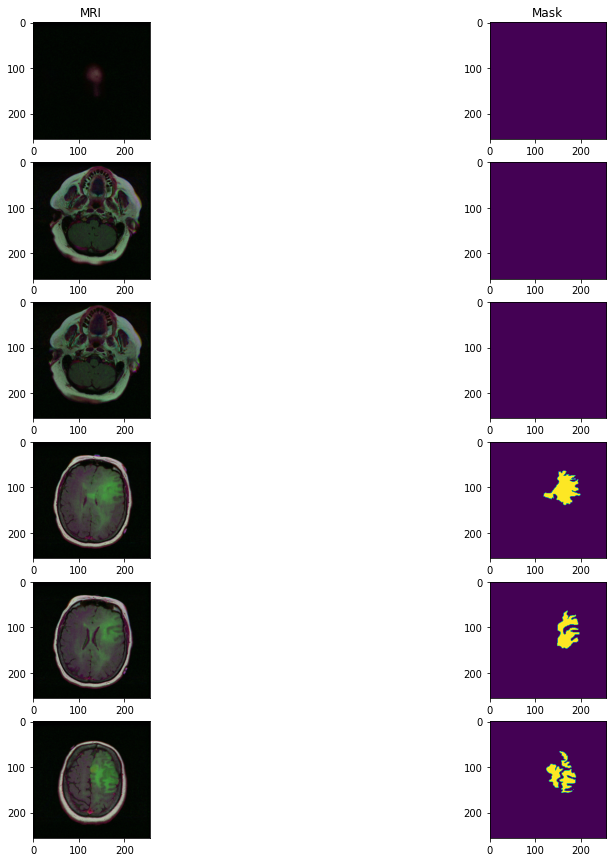

In [5]:
#display images of negative and positive samples - negative samples have an empty mask
fig, axs = plt.subplots(6,2, figsize=(15,15))
for ax, col in zip(axs[0], ['MRI', 'Mask']):
    ax.set_title(col)
    
display_imgs = empty_mask_samples+nonempty_mask_samples #concat lists for easy plotting
#print(display_imgs)
for i in range(len(display_imgs)):
    mask_path = display_imgs[i]
    img_path = mask_path[:mask_path.find('mask')-1]+'.tif'
    axs[i,0].imshow(np.array(cv2.imread(img_path)))
    axs[i,1].imshow(np.array(cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)))

# Create Torch Dataset

In [6]:
#store list of train files for dataset creation of the form (train_img, mask_img, pos_neg_result(1/0))
#these tuples are fed into the datasets we create below
file_list = []
for directory in [os.path.join(root,x) for x in os.listdir(root) if os.path.isdir(os.path.join(root, x))]:
    for file in os.listdir(directory):
        #add files to list
        if 'mask' not in file:
            result = 0
            img_path = os.path.join(directory, file)
            mask_path = os.path.join(directory, file[:file.find('.tif')]+'_mask.tif')
                
            #check if mask is nonempty
            if np.max(cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)) > 0:
                result = 1
            
            file_list.append([img_path, mask_path, result])
            

**Classification**

In [7]:
class Brain_MRI_Classification_Dataset(data.Dataset):
    def __init__(self, inputs, transform=None):
        self.inputs = inputs
        self.transform = transform
        self.input_dtype = torch.float32
        self.target_dtype = torch.float32
        
    def __len__(self):
        return len(self.inputs)
    
    def __getitem__(self, index):
        #for classification return only the image and the binary label
        img_path = self.inputs[index][0]
        image = cv2.imread(img_path)
        x = torch.from_numpy(np.transpose(np.array(image), (2,0,1))).type(self.input_dtype)
        y = torch.from_numpy(np.array(self.inputs[index][2])).type(self.target_dtype)
        
        if self.transform is not None:
            x = self.transform(x)
        
        return x,y
    
    

**Segmentation**

In [8]:
class Brain_MRI_Segmentation_Dataset1(data.Dataset):
    def __init__(self, inputs, transform=None):
        self.inputs = inputs
        self.transform = transform
        self.input_dtype = torch.float32
        self.target_dtype = torch.float32
        
    def __len__(self):
        return len(self.inputs)
    
    def __getitem__(self, index):
        #for classification return only the image and the binary label
        img_path = self.inputs[index][0]
        mask_path = self.inputs[index][1]
        #mask_img = cv2.normalize(cv2.imread(mask_path), None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
        mask_img = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
#         x = torch.from_numpy(np.transpose(np.array(cv2.imread(img_path)), (2,0,1))).type(self.input_dtype)
#         y = torch.from_numpy(np.resize(np.array(mask_img)/255, (1,256,256))).type(self.target_dtype)
        x = (np.transpose(np.array(cv2.imread(img_path)), (0, 1, 2)))
        y = (np.resize(np.array(mask_img)/255, (256,256, 1)))

#         print("before transform", x.shape)
#         print("before transform", y.shape)
        copy_x = np.copy(x)
        copy_y = np.copy(y)
        if self.transform is not None:
            aug = self.transform(image=copy_x, mask=copy_y)
            x = torch.from_numpy(np.transpose(aug['image'], (2, 0, 1)).copy()).type(self.input_dtype)
            y = torch.from_numpy(np.resize(aug['mask'], (1, 256, 256)).copy()).type(self.target_dtype)
#             x = self.transform(x)
#             y = self.transform(y)
#             print("after transform", x.shape)
#             print("before transform", y.shape)
        
        return x,y

In [9]:
class Brain_MRI_Segmentation_Dataset(data.Dataset):
    def __init__(self, inputs, transform=None):
        self.inputs = inputs
        self.transform = transform
        self.input_dtype = torch.float32
        self.target_dtype = torch.float32
        
    def __len__(self):
        return len(self.inputs)
    
    def __getitem__(self, index):
        #for classification return only the image and the binary label
        img_path = self.inputs[index][0]
        mask_path = self.inputs[index][1]
        #mask_img = cv2.normalize(cv2.imread(mask_path), None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
        mask_img = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
        x = torch.from_numpy(np.transpose(np.array(cv2.imread(img_path)), (2,0,1))).type(self.input_dtype)
        y = torch.from_numpy(np.resize(np.array(mask_img)/255, (1,256,256))).type(self.target_dtype)
#         x = (np.transpose(np.array(cv2.imread(img_path)), (2,0,1)))
#         y = (np.resize(np.array(mask_img)/255, (1,256,256)))

#         print("before transform", x.shape)
#         print("before transform", y.shape)
        if self.transform is not None:
#             augmented = self.transform(image=x, mask=y)
#             x = augmented['image']
#             y = augmented['mask']
            x = self.transform(x)
            y = self.transform(y)
#             print("after transform", x.shape)
#             print("before transform", y.shape)
        
        return x,y

In [10]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

transform1 = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.01, scale_limit=0.04, rotate_limit=0, p=0.25),
   # ToTensorV2(transpose_mask=False)
], p=1)


In [11]:
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(90),
    transforms.RandomAffine(degrees=15, translate=(0.1, 0.1), scale=(0.8, 0.8))
])

#augmented_mri_dataset = Brain_MRI_Segmentation_Dataset(positive_diagnoses, transform=transform)

In [12]:
positive_diagnoses = [x for x in file_list if x[2] == 1]


In [13]:
## Testing transform methods
mri_dataset = Brain_MRI_Segmentation_Dataset(positive_diagnoses, transform=transform)
mri_dataset.__getitem__(1)

/opt/conda/lib/python3.7/site-packages/torchvision/transforms/functional_tensor.py:876: UserWarning: Argument fill/fillcolor is not supported for Tensor input. Fill value is zero
  warnings.warn("Argument fill/fillcolor is not supported for Tensor input. Fill value is zero")


(tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],
 
         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],
 
         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]),
 tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
       

In [14]:
## Testing transform methods
mri_dataset = Brain_MRI_Segmentation_Dataset1(positive_diagnoses, transform=transform1)
mri_dataset.__getitem__(2)

(tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 1., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],
 
         [[0., 0., 0.,  ..., 4., 4., 5.],
          [0., 0., 0.,  ..., 7., 7., 8.],
          [0., 0., 0.,  ..., 7., 7., 6.],
          ...,
          [0., 0., 0.,  ..., 4., 4., 5.],
          [0., 0., 0.,  ..., 4., 5., 5.],
          [0., 0., 0.,  ..., 7., 7., 6.]],
 
         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]),
 tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
       

**IoU Metric**
Obtained from: https://www.kaggle.com/iezepov/fast-iou-scoring-metric-in-pytorch-and-numpy

In [15]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor, threshold=0.5):
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape
    SMOOTH = 1e-6
    outputs = outputs.squeeze(1)  # BATCH x 1 x H x W => BATCH x H x W
    labels = labels.squeeze(1)
    
    bin_out = torch.where(outputs > threshold, 1, 0).type(torch.int16)
    labels = labels.type(torch.int16)
    
    intersection = (bin_out & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    union = (bin_out | labels).float().sum((1, 2))         # Will be zero if both are 0
    
    iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our division to avoid 0/0
    
    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds
    
    return thresholded.mean()  # Or thresholded.mean() if you are interested in average across the batch

**Dice Loss**

In [16]:
#Dice Loss Function - taken from: https://github.com/kevinzakka/pytorch-goodies/blob/master/losses.py
def dice_loss(logits, true, eps=1e-7):
    """Computes the Sørensen–Dice loss.
    Note that PyTorch optimizers minimize a loss. In this
    case, we would like to maximize the dice loss so we
    return the negated dice loss.
    Args:
        true: a tensor of shape [B, 1, H, W].
        logits: a tensor of shape [B, C, H, W]. Corresponds to
            the raw output or logits of the model.
        eps: added to the denominator for numerical stability.
    Returns:
        dice_loss: the Sørensen–Dice loss.
    """
    num_classes = logits.shape[1]
    if num_classes == 1:
        true_1_hot = torch.eye(num_classes + 1)[true.long().squeeze(1)]
        true_1_hot = true_1_hot.permute(0, 3, 1, 2).float()
        true_1_hot_f = true_1_hot[:, 0:1, :, :]
        true_1_hot_s = true_1_hot[:, 1:2, :, :]
        true_1_hot = torch.cat([true_1_hot_s, true_1_hot_f], dim=1)
        pos_prob = torch.sigmoid(logits)
        neg_prob = 1 - pos_prob
        probas = torch.cat([pos_prob, neg_prob], dim=1)
    else:
        true_1_hot = torch.eye(num_classes)[true.long().squeeze(1)]
        true_1_hot = true_1_hot.permute(0, 3, 1, 2).float()
        probas = F.softmax(logits, dim=1)
    true_1_hot = true_1_hot.type(logits.type())
    dims = (0,) + tuple(range(2, true.ndimension()))
    intersection = torch.sum(probas * true_1_hot, dims)
    cardinality = torch.sum(probas + true_1_hot, dims)
    dice_loss = (2. * intersection / (cardinality + eps)).mean()
    return (1 - dice_loss)

In [17]:
#combined cross entropy and dice loss
def bce_dice_loss(output, target):
    bce = nn.BCEWithLogitsLoss()
    return bce(output, target) + dice_loss(output, target)

# Models

**UNet**

In [18]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        return self.block(x)

class DownConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DownConv, self).__init__()
        self.sequence = nn.Sequential(
            ConvBlock(in_channels, out_channels),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        
    def forward(self, x):
        return self.sequence(x)
        
class UpConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UpConv, self).__init__()
        self.sequence = nn.Sequential(
            nn.ConvTranspose2d(in_channels, in_channels, kernel_size=2, stride=2),
            ConvBlock(in_channels, out_channels)
        )
        
    def forward(self, x):
        return self.sequence(x)
        
class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super(UNet, self).__init__()
        #input_dim = 256
        self.encoder = nn.ModuleList([
            DownConv(in_channels, 64), #128
            DownConv(64, 128), #64
            DownConv(128, 256), #32
            DownConv(256, 512) #16
        ])
        
        self.bottleneck = ConvBlock(512, 1024)
        
        #extra channels allow for concatenation of skip connections in upsampling block
        self.decoder = nn.ModuleList([
            UpConv(512+1024,512), #32
            UpConv(256+512,256), #64
            UpConv(128+256,128), #128
            UpConv(64+128,64) #256
        ])
        
        self.output_conv = nn.Conv2d(64, out_channels, kernel_size=1)
        
    def forward(self, x):
        skips = []
        o = x
        for layer in self.encoder:
            o = layer(o)
            skips.append(o)
        
        o = self.bottleneck(o)
        
        for i, layer in enumerate(self.decoder):
            #print(o.size())
            o = torch.cat((skips[len(skips)-i-1],o), dim=1)
            #print(o.size())
            o = layer(o)
        
        return self.output_conv(o)

**UNet++**

In [19]:
#depth 5 is the default UNet++ architecture, layer depth-1 is the bottleneck for the traditional UNet architecture
class UNetPlusPlus(nn.Module):
    def __init__(self, input_channels=3, output_channels=1, depth=5):
        super(UNetPlusPlus, self).__init__()
        self.depth = depth
        self.output_channels = output_channels
        self.conv_map = nn.ModuleDict({})
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        
        #construct all convolution blocks
        #sums in input channels account for concatenated skip connections from previous j nodes
        for i in range(self.depth):
            for j in range(self.depth-i):
                if i == 0 and j == 0:
                    self.conv_map[str((i,j))] = ConvBlock(in_channels=input_channels, out_channels=32)
                #elif i == 0:
                 #   self.conv_map[(i,j)] = ConvBlock(in_channels=(32*j)+64, out_channels=32)
                elif j == 0:
                    self.conv_map[str((i,j))] = ConvBlock(in_channels=32*(2**(i-1)), out_channels=32*(2**i))
                else:
                    self.conv_map[str((i,j))] = ConvBlock(in_channels=((32*(2**i))*j)+32*(2**(i+1)), out_channels=32*(2**i))
                    
        #implement 1x1 convolutions which enable us to compute completed segmentation maps at the supervised nodes:
        #X_0,j; j ={1,2,3,...,depth-1}
            
        self.output_convs = nn.ModuleList()
        for j in range(depth-1):
            self.output_convs.append(nn.Conv2d(32, output_channels, kernel_size=1))

    def forward(self, x):
        outputs = {}
        for j in range(self.depth):
            for i in range(self.depth-j):
                #X_0,0 takes the input image
                if i == 0 and j == 0:
                    outputs[(i,j)] = self.conv_map[str((i,j))](x)
                #X_i,0 convolves over the downsampled output of the previous convolution in the backbone
                elif j == 0:
                    outputs[(i,j)] = self.conv_map[str((i,j))]( self.pool(outputs[(i-1,j)]) )
                else:
                    #concatenate all skip connections from same row
                    concats = outputs[(i,0)]
                    for j_ in range(1,j):
                        concats = torch.cat((outputs[(i,j_)], concats), dim=1)
                        
                    #concatenate upsampled output from lower depth to skip connections
                    concats = torch.cat( (concats, self.upsample(outputs[(i+1,j-1)])), dim=1 )
                    
                    outputs[(i,j)] = self.conv_map[str((i,j))](concats)
        
        #compute averaged output
        dev = 'cuda' if torch.cuda.is_available() else 'cpu'
        averaged_output = torch.zeros(x.size()[0], self.output_channels, x.size()[2], x.size()[3], requires_grad=True, device=dev)
        for j in range(1,self.depth):
            averaged_output =  averaged_output + self.output_convs[j-1](outputs[(0,j)])
        
        averaged_output = averaged_output / (self.depth-1)
        
        return averaged_output
            
                

# Train/Validation Loop

In [20]:
#train model
#batch -
#N,3,256,256
#N,1,256,256

def run_experiment(model_name, model, optimizer, criterion, train_loader, val_loader, device='cuda', num_epochs=50, clear_mem=False):
    
    #######################
    #Train model          #
    #######################
    print('Model sent to ' + str(device))
    model.to(device)
    loss_history = []
    train_history = []
    val_history = []
    losses = []
    train_scores = [] # hold IoU scores
    iters = 0
    for epoch in range(num_epochs):
        if epoch % 10 == 0:
            print(f'Epoch {epoch+1}/{num_epochs}')
        
        for i,batch in enumerate(train_loader):
            img = batch[0].to(device)
            msk = batch[1].to(device)

            optimizer.zero_grad()
            output = model(img)
            loss = criterion(output, msk)
            loss.backward()
            optimizer.step()

            losses.append(loss.item())
            train_scores.append(iou_pytorch(output.detach(), msk))
#           #  print(loss.item())
#           #  print(iou_pytorch(output.detach(), msk))
            iters += 1
        
            #if iters % 500 == 0:
                #print(f'Loss: [{loss}]')
                
    #for i in range(len(train_scores)):
     #   train_scores[i] = train_scores[i].mean()
        
    #######################
    #Validate model       #
    #######################
    
    model.eval()
    val_losses = []
    val_scores = []

    for i,batch in enumerate(val_loader):
            img = batch[0].to(device)
            msk = batch[1].to(device)

            output = model(img)
            loss = criterion(output, msk)
            val_scores.append(iou_pytorch(output.detach(), msk))
            val_losses.append(loss.item())
            
    results = {
        'model_name': model_name,
        'train_losses': losses,
        'train_scores': train_scores,
        'val_losses': val_losses,
        'val_scores': val_scores
    }
    
    torch.save(model.state_dict(), '/kaggle/working/'+model_name+'.pth')
    if clear_mem:
        del model
        del optimizer
        del criterion
        torch.cuda.empty_cache()
        
    return results

In [45]:
#train model
#batch -
#N,3,256,256
#N,1,256,256

def run_experiment1(model_name, model, optimizer, criterion, train_loader, val_loader, device='cuda', num_epochs=50, clear_mem=False):
    
    #######################
    #Train model          #
    #######################
    print('Model sent to ' + str(device))
    model.to(device)
    loss_train_history = []
    loss_val_history = []
    train_history = []
    val_history = []
    losses = []
    train_scores = [] # hold IoU scores
    val_losses = []
    val_scores = []
    iters = 0
    for epoch in range(num_epochs):
        train_iou = []
        val_iou = []
        losses_each_epoch = []
        if epoch % 10 == 0:
            print(f'Epoch {epoch+1}/{num_epochs}')
        
        for i,batch in enumerate(train_loader):
            img = batch[0].to(device)
            msk = batch[1].to(device)

            optimizer.zero_grad()
            output = model(img)
            loss = criterion(output, msk)
            loss.backward()
            optimizer.step()

            losses.append(loss.item())
            losses_each_epoch.append(loss.item())
            train_scores.append(iou_pytorch(output.detach(), msk))
            train_iou.append(iou_pytorch(output.detach(), msk).cpu().numpy())
#           #  print(loss.item())
#           #  print(iou_pytorch(output.detach(), msk))
            iters += 1
        
            #if iters % 500 == 0:
                #print(f'Loss: [{loss}]')
        #model.eval()
        

        for i,batch in enumerate(val_loader):
                img = batch[0].to(device)
                msk = batch[1].to(device)

                output = model(img)
#                 print(output.shape)
#                 print(msk.shape)
                loss = criterion(output, msk)
                val_scores.append(iou_pytorch(output.detach(), msk))
                val_losses.append(loss.item())
                val_iou.append(iou_pytorch(output.detach(), msk).cpu().numpy())
             
        loss_train_history.append(np.array(losses_each_epoch).mean())
        train_history.append(np.array(train_iou).mean())
        loss_val_history.append(np.array(val_losses).mean())
        val_history.append(np.array(val_iou).mean())
        
    #for i in range(len(train_scores)):
     #   train_scores[i] = train_scores[i].mean()
        
    #######################
    #Validate model       #
    #######################
    

            
    results = {
        'model_name': model_name,
        'train_losses': losses,
        'train_scores': train_scores,
        'val_losses': val_losses,
        'val_scores': val_scores,
        'loss_train_history': loss_train_history,
        'loss_val_history': loss_val_history,
        'train_history': train_history,
        'val_history':val_history
    }
    
    torch.save(model.state_dict(), '/kaggle/working/'+model_name+'.pth')
    if clear_mem:
        del model
        del optimizer
        del criterion
        torch.cuda.empty_cache()
        
    return results

In [46]:
def plot_training_scores(losses, train_scores, model_name):
    #plot loss and IoU
    fig, axs = plt.subplots(1,2, figsize=(10,5))
    axs[0].set_title('Train BCE Loss')
    axs[0].plot(range(len(losses)), losses)

    axs[1].set_title('IoU Score vs Training Step')
    axs[1].plot(range(len(train_scores)), train_scores)
    
    print(f'MEAN TRAIN IOU: {torch.mean(torch.tensor(train_scores))}')
    fig.savefig('/kaggle/working/'+model_name+'_plot_training_scores.jpg', bbox_inches='tight') 

def plot_validation_scores(val_losses, val_scores, model_name):
    #plot loss and IoU scores - we use a histogram because we care about the distribution of losses, not its progression
    fig, axs = plt.subplots(1,2, figsize=(14,7))
    axs[0].set_title('BCE Loss on Validation Set')
    axs[0].hist(val_losses)

    temp = [t.cpu().item() for t in val_scores]
    axs[1].set_title('IoU Scores on Validation Set')
    axs[1].hist(temp)
    axs[1].axvline(np.median(np.array(temp)), color='k', linestyle='dashed', linewidth=1)
    print(f'MEAN VAL IOU: {mean(temp)}')
    fig.savefig('/kaggle/working/'+model_name+'_plot_validation_scores.jpg', bbox_inches='tight') 
    
def visualize_segmentation(model, data_loader, model_name, num_samples=5, device='cuda'):
    #visualize segmentation on unseen samples
    fig, axs = plt.subplots(num_samples, 3, figsize=(60,60))

    for ax, col in zip(axs[0], ['MRI', 'Ground Truth', 'Predicted Mask']):
        ax.set_title(col)

    index = 0
    for i,batch in enumerate(data_loader):
            img = batch[0].to(device)
            msk = batch[1].to(device)

            output = model(img)

            for j in range(batch[0].size()[0]): #iterate over batchsize
                axs[index,0].imshow(np.transpose(img[j].detach().cpu().numpy(), (1,2,0)).astype(np.uint8), cmap='bone', interpolation='none')

                axs[index,1].imshow(np.transpose(img[j].detach().cpu().numpy(), (1,2,0)).astype(np.uint8), cmap='bone', interpolation='none')
                axs[index,1].imshow(torch.squeeze(msk[j]).detach().cpu().numpy(), cmap='Blues', interpolation='none', alpha=0.5)

                axs[index,2].imshow(np.transpose(img[j].detach().cpu().numpy(), (1,2,0)).astype(np.uint8), cmap='bone', interpolation='none')
                axs[index,2].imshow(torch.squeeze(output[j]).detach().cpu().numpy(), cmap='Greens', interpolation='none', alpha=0.5)

                index += 1

            if index >= num_samples:
                break

    plt.tight_layout()
    fig.savefig('/kaggle/working/'+model_name+'_visualize_segmentation.jpg', bbox_inches='tight') 
    
def plot_model_history(model_name,
                        train_history, val_history, 
                        num_epochs):
    
    x = np.arange(num_epochs)

    fig = plt.figure(figsize=(10, 6))
    plt.plot(x, train_history, label='train iou', lw=3, c="springgreen")
    plt.plot(x, val_history, label='validation iou', lw=3, c="deeppink")

    plt.title(f"{model_name}", fontsize=15)
    plt.legend(fontsize=12)
    plt.xlabel("Epoch", fontsize=15)
    plt.ylabel("iou", fontsize=15)

    #fn = str(int(time.time())) + ".png"
    plt.show()
    fig.savefig('/kaggle/working/'+model_name+'_plot_model_history.jpg', bbox_inches='tight') 

def plot_model_loss(model_name, loss_train_history, loss_val_history, num_epochs):
    x = np.arange(num_epochs)

    fig = plt.figure(figsize=(10, 6))
    plt.plot(x, loss_train_history, label='train iou', lw=3, c="springgreen")
    plt.plot(x, loss_val_history, label='validation iou', lw=3, c="deeppink")

    plt.title(model_name, fontsize=15)
    plt.legend(fontsize=12)
    plt.xlabel("Epoch", fontsize=15)
    plt.ylabel("loss", fontsize=15)

    #fn = str(int(time.time())) + ".png"
    plt.show()
    fig.savefig('/kaggle/working/'+model_name+'_loss.jpg', bbox_inches='tight') 

# Experiments

**UNet with SGD**

In [49]:
#load data
positive_diagnoses = [x for x in file_list if x[2] == 1]
#print(positive_diagnoses[:5])
mri_dataset = Brain_MRI_Segmentation_Dataset(positive_diagnoses)

validation_size = int(0.3 * len(mri_dataset))
train_set, val_set = data.random_split(mri_dataset, [len(mri_dataset)-validation_size, validation_size])

train_loader = data.DataLoader(dataset=train_set, batch_size=2, shuffle=True)
val_loader = data.DataLoader(dataset=val_set, batch_size=2, shuffle=False)

device = 'cuda' if torch.cuda.is_available() else 'cpu'

num_epochs = 50


model = UNet()
optimizer = SGD(model.parameters(), lr=0.01, momentum=0.9)
criterion = nn.BCEWithLogitsLoss()

results = run_experiment1('Unet_SGD', model, optimizer, criterion, train_loader, val_loader, device=device, num_epochs=num_epochs, clear_mem=False)

Model sent to cuda
Epoch 1/50
Epoch 11/50
Epoch 21/50
Epoch 31/50
Epoch 41/50


MEAN TRAIN IOU: 0.7942764759063721
MEAN VAL IOU: 0.5662621462392141


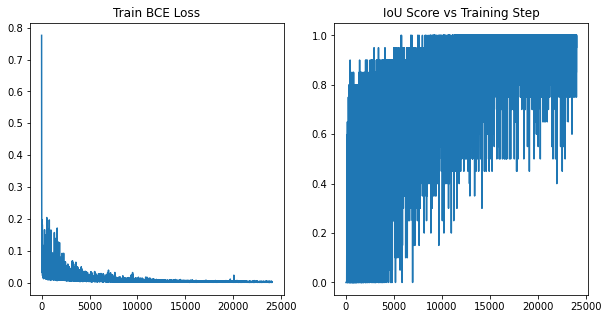

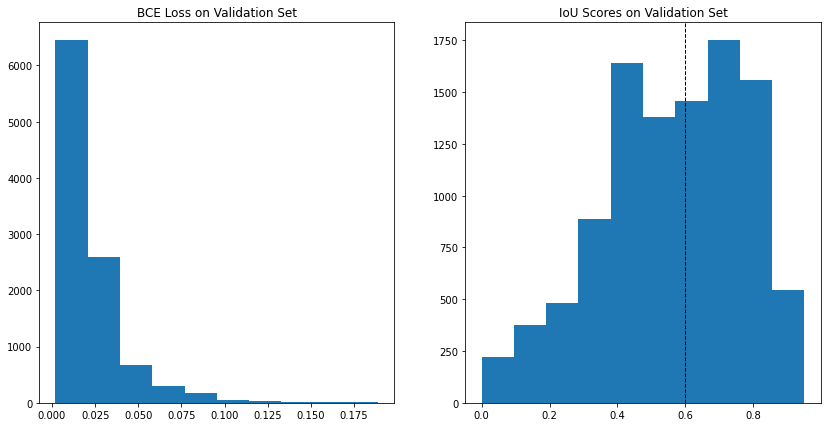

In [50]:
plot_training_scores(results['train_losses'], results['train_scores'], 'Unet_SGD')
plot_validation_scores(results['val_losses'], results['val_scores'], 'Unet_SGD')

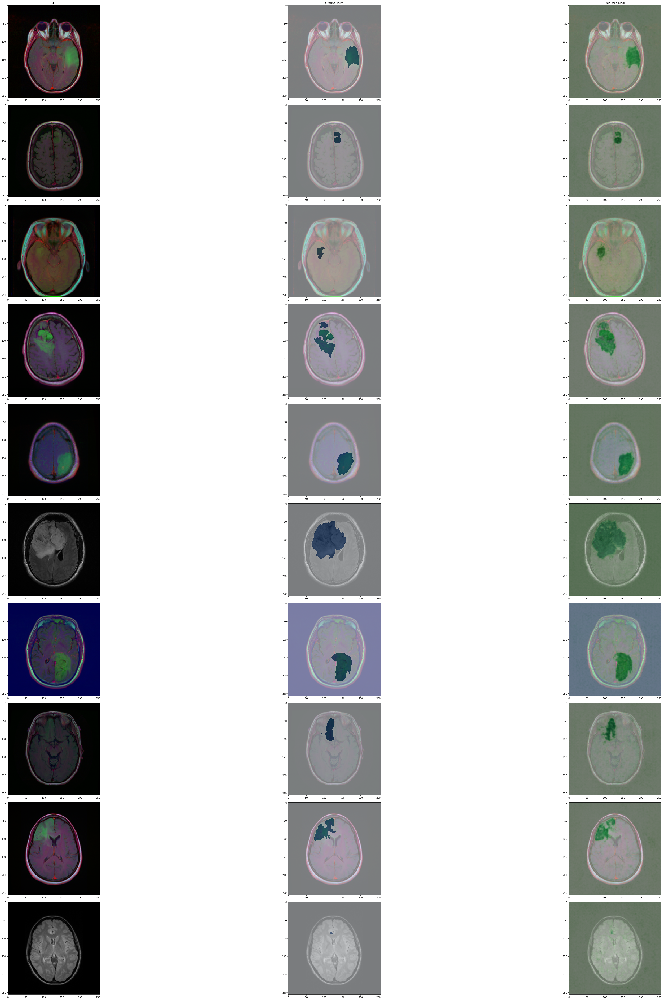

In [51]:
#visualization over unseen validation samples
visualize_segmentation(model, val_loader, 'Unet_SGD', num_samples=10, device='cuda')
# del model
# del optimizer
# del criterion
# torch.cuda.empty_cache()

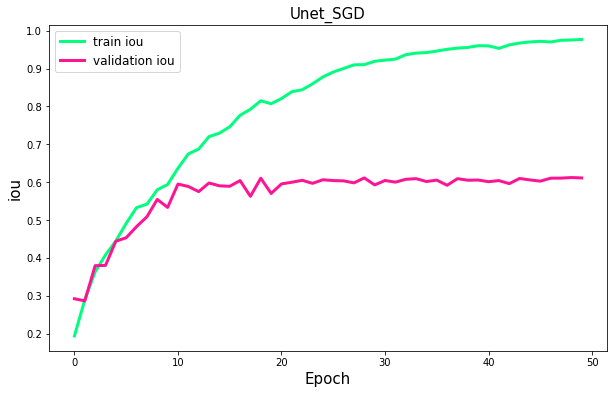

In [52]:
plot_model_history('Unet_SGD',
                        results['train_history'], results['val_history'], 
                        num_epochs)

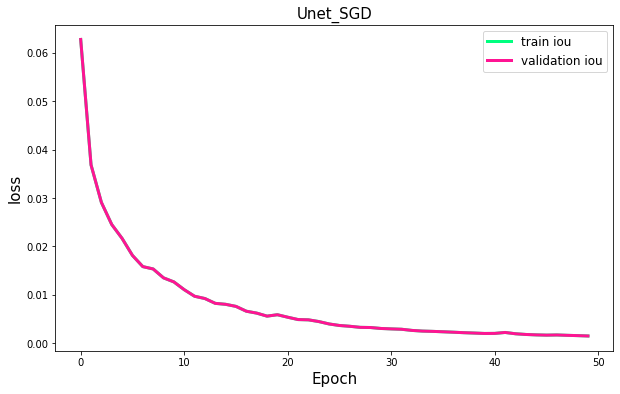

In [53]:
plot_model_loss('Unet_SGD', results['loss_train_history'], results['loss_train_history'], num_epochs)

In [54]:
#     x = np.arange(num_epochs)

#     fig = plt.figure(figsize=(10, 6))
#     plt.plot(x, results['loss_history'], label='loss', lw=3, c="springgreen")

#     plt.title(f"UNetwithSGD", fontsize=15)
#     plt.legend(fontsize=12)
#     plt.xlabel("Epoch", fontsize=15)
#     plt.ylabel("loss", fontsize=15)

#     #fn = str(int(time.time())) + ".png"
#     plt.show()
#     fig.savefig('/kaggle/working/'+model_name+'_loss.jpg', bbox_inches='tight') 
    

**UNet with Adam**

In [55]:
num_epochs = 50
model = UNet()
optimizer = Adam(model.parameters())
criterion = nn.BCEWithLogitsLoss()

results = run_experiment1('Unet_Adam', model, optimizer, criterion, train_loader, val_loader, device=device, num_epochs=num_epochs, clear_mem=False)

Model sent to cuda
Epoch 1/50
Epoch 11/50
Epoch 21/50
Epoch 31/50
Epoch 41/50


MEAN TRAIN IOU: 0.4140499234199524
MEAN VAL IOU: 0.4985436974002898


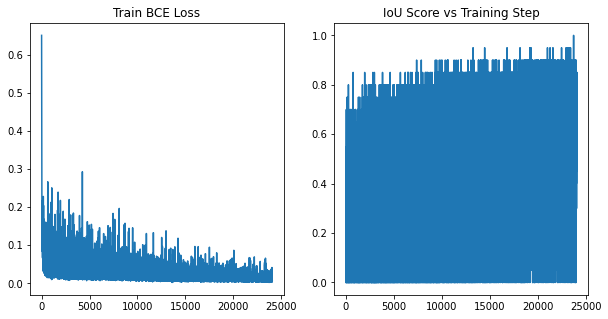

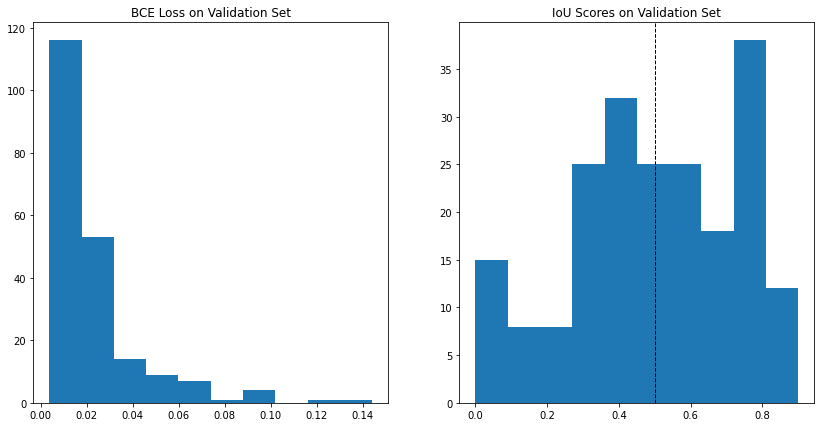

In [56]:
plot_training_scores(results['train_losses'], results['train_scores'], 'Unet_Adam')
plot_validation_scores(results['val_losses'], results['val_scores'], 'Unet_Adam')

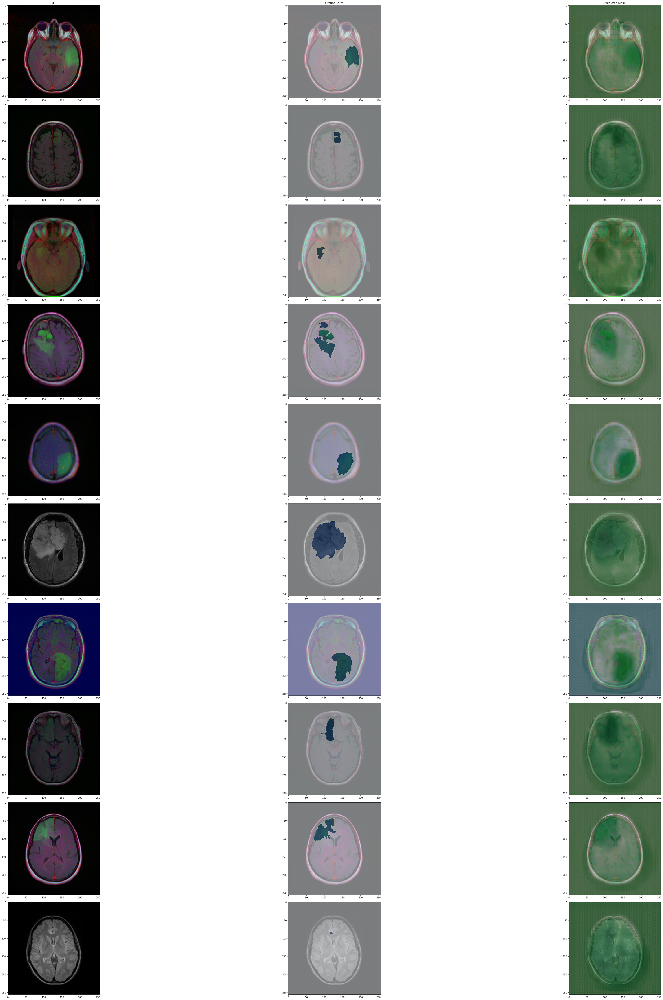

In [57]:
#visualization over unseen validation samples
visualize_segmentation(model, val_loader, 'Unet_Adam', num_samples=10, device='cuda')
# del model
# del optimizer
# del criterion
# torch.cuda.empty_cache()

In [58]:
plot_model_history('Unet_Adam',
                        results['train_history'], results['val_history'], 
                        num_epochs)

KeyError: 'train_history'

In [ ]:
plot_model_loss('Unet_Adam', results['loss_train_history'], results['loss_train_history'], num_epochs)

**UNet with Augmented Dataset and SGD**

In [59]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

transform1 = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.01, scale_limit=0.04, rotate_limit=0, p=0.25),
#     ToTensorV2(transpose_mask=False)
])


In [60]:
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(90),
    transforms.RandomAffine(degrees=15, translate=(0.1, 0.1), scale=(0.8, 0.8))
])

augmented_mri_dataset = Brain_MRI_Segmentation_Dataset1(positive_diagnoses, transform=transform1)


validation_size = int(0.3 * len(augmented_mri_dataset))
atrain_set, aval_set = data.random_split(augmented_mri_dataset, [len(augmented_mri_dataset)-validation_size, validation_size])

aug_train_loader = data.DataLoader(dataset=atrain_set, batch_size=1, shuffle=True)
aug_val_loader = data.DataLoader(dataset=aval_set, batch_size=1, shuffle=False)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
trainimages, trainlabels = next(iter(aug_train_loader))
# print(trainimages.shape)
# print(trainlabels.shape)
num_epochs = 50
model = UNet()
optimizer = SGD(model.parameters(), lr=0.01, momentum=0.9)
criterion = nn.BCEWithLogitsLoss()

results = run_experiment1('Unet_SGD_AugmentedData', model, optimizer, criterion, aug_train_loader, aug_val_loader, device=device, num_epochs=num_epochs, clear_mem=False)

Model sent to cuda
Epoch 1/50
Epoch 11/50
Epoch 21/50
Epoch 31/50
Epoch 41/50


In [61]:
# def visualize_segmentation(data_loader, num_samples=5, device='cuda'):
#     #visualize segmentation on unseen samples
#     fig, axs = plt.subplots(num_samples, 2, figsize=(60,60))

#     for ax, col in zip(axs[0], ['MRI', 'Ground Truth']):
#         ax.set_title(col)

#     index = 0
#     for i,batch in enumerate(data_loader):
#             img = batch[0].to(device)
#             msk = batch[1].to(device)


#             for j in range(batch[0].size()[0]): #iterate over batchsize
#                 axs[index,0].imshow(np.transpose(img[j].detach().cpu().numpy(), (1,2,0)).astype(np.uint8), cmap='bone', interpolation='none')

#                 axs[index,1].imshow(np.transpose(img[j].detach().cpu().numpy(), (1,2,0)).astype(np.uint8), cmap='bone', interpolation='none')
#                 axs[index,1].imshow(torch.squeeze(msk[j]).detach().cpu().numpy(), cmap='Blues', interpolation='none', alpha=0.5)


#                 index += 1

#             if index >= num_samples:
#                 break
# visualize_segmentation(aug_val_loader)

MEAN TRAIN IOU: 0.5822848081588745
MEAN VAL IOU: 0.5668223949092148


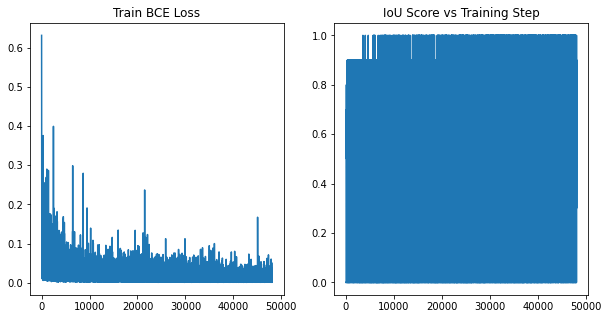

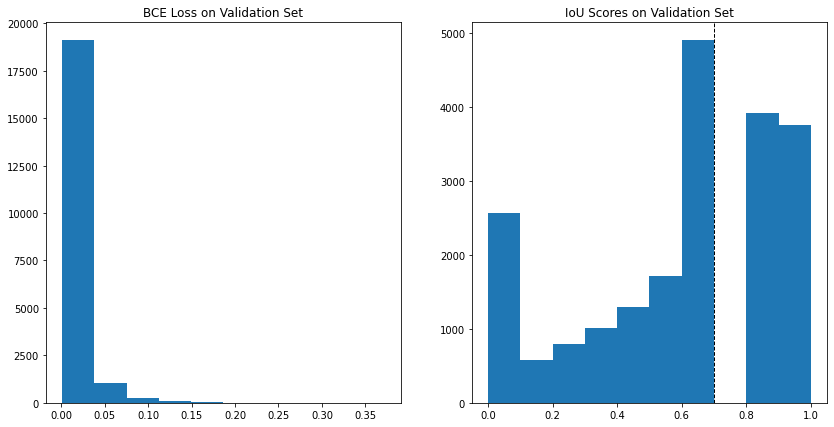

In [62]:
plot_training_scores(results['train_losses'], results['train_scores'], 'Unet_SGD_AugmentedData')
plot_validation_scores(results['val_losses'], results['val_scores'], 'Unet_SGD_AugmentedData')

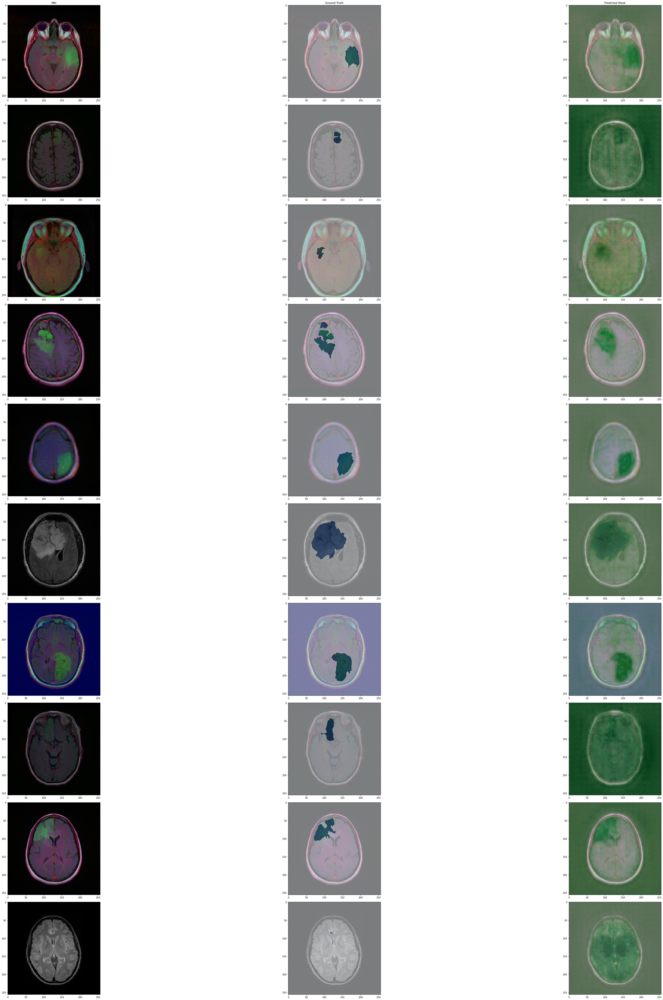

In [63]:
#visualization over unseen validation samples
visualize_segmentation(model, val_loader, 'Unet_SGD_AugmentedData', num_samples=10, device='cuda')
# del model
# del optimizer
# del criterion
# torch.cuda.empty_cache()

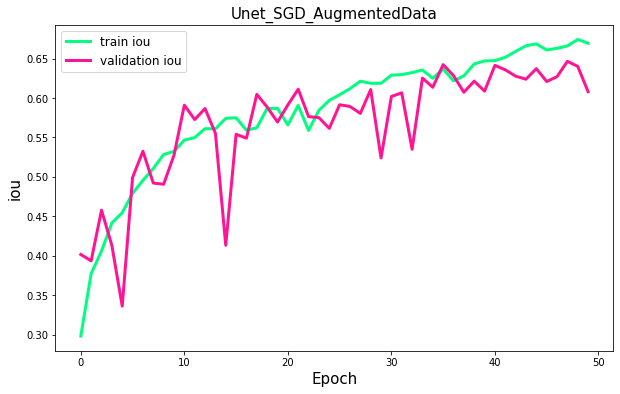

In [64]:
plot_model_history('Unet_SGD_AugmentedData',
                        results['train_history'], results['val_history'], 
                        num_epochs)

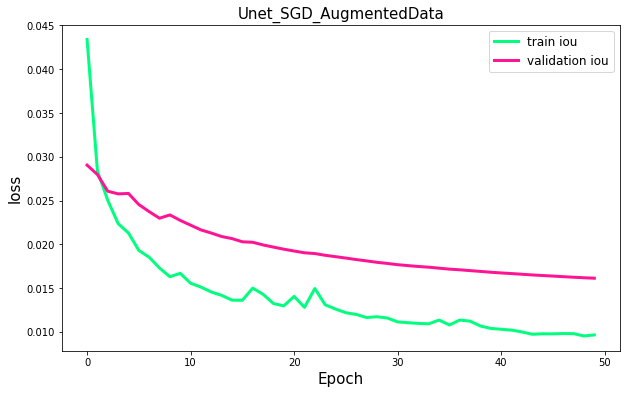

In [66]:
plot_model_loss('Unet_SGD_AugmentedData', results['loss_train_history'], results['loss_val_history'], num_epochs)

Adam and SGD Optimizers did not provide too much of a difference, but we can observe that the validation distribution of IoU scores is more strongly skewed towards 1 when we use the augmented dataset.

Another area to experiment is the loss function, while for segmentation tasks we actually want to minimize the dice loss, it sometimes provides bad gradients which leads to crossentropy being used in practice. Let's compare the performance of our previous cross entropy optimization with optimization of the dice loss and a combined crossentropy-dice loss. From now on we'll use the augmented dataset as the model performs best on this.

**UNet with Dice Loss**

In [ ]:
num_epochs = 50
model = UNet()
optimizer = SGD(model.parameters(), lr=0.01, momentum=0.9)
criterion = dice_loss

results = run_experiment('Unet_SGD_AugmentedData_DiceLoss', model, optimizer, criterion, aug_train_loader, aug_val_loader, device=device, num_epochs=num_epochs, clear_mem=False)

In [ ]:
plot_training_scores(results['train_losses'], results['train_scores'])
plot_validation_scores(results['val_losses'], results['val_scores'])

In [ ]:
#visualization over unseen validation samples
visualize_segmentation(model, aug_val_loader, num_samples=10, device='cuda')
del model
del optimizer
del criterion
torch.cuda.empty_cache()

**UNet with Combined CrossEntropy-Dice Loss**

In [ ]:
num_epochs = 50
model = UNet()
optimizer = SGD(model.parameters(), lr=0.01, momentum=0.9)
criterion = bce_dice_loss

results = run_experiment('Unet_SGD_AugmentedData_CE-DiceLoss', model, optimizer, criterion, aug_train_loader, aug_val_loader, device=device, num_epochs=num_epochs, clear_mem=False)

In [ ]:
plot_training_scores(results['train_losses'], results['train_scores'])
plot_validation_scores(results['val_losses'], results['val_scores'])

In [ ]:
#visualization over unseen validation samples
visualize_segmentation(model, aug_val_loader, num_samples=10, device='cuda')
del model
del optimizer
del criterion
torch.cuda.empty_cache()

It's notable that using the Dice Loss seems to minimize the crossentropy for the validation set very well and that using the dice loss in conjuction with cross entropy produces a distribution of validation dice scores whose median is closest to one when compared with using only crossentropy and only dice loss. 

This makes sense as by including the dice loss we can incentivize the model to optimize for what we care about: segmentation accuracy, while including a cross entropy component allows us to take advantage of its clean gradients - this is especially important because the dice loss can sometimes return very large or very small gradients.

All the distributions of Dice Scores on the validation set are bimodal, indicating that the model variance may be high. This can be handled in a few ways: 
1. Our model capacity should be reduced so that it does not overfit the training data
2. Our model needs to train for less time in order to learn a less complex representation of the input
3. We need a more representative dataset or need to identify the class of samples that are more challenging and preferentially sample them

**UNet++ with Combined CrossEntropy-Dice Loss**
We will use an Adam optimizer here as suggested in the original UNet++ paper

In [ ]:
num_epochs = 50
model = UNetPlusPlus()
optimizer = Adam(model.parameters(), lr=3e-4)
criterion = bce_dice_loss

results = run_experiment('Unet++_AugmentedData_CE-DiceLoss', model, optimizer, criterion, aug_train_loader, aug_val_loader, device=device, num_epochs=num_epochs, clear_mem=False)

In [ ]:
plot_training_scores(results['train_losses'], results['train_scores'])
plot_validation_scores(results['val_losses'], results['val_scores'])

In [ ]:
#visualization over unseen validation samples
visualize_segmentation(model, aug_val_loader, num_samples=10, device='cuda')

UNet++ seems to learn the masks a bit more accurately, this is likely because of both the combined crossentropy-dice loss as well as due to the dense structure of UNet++'s residual connections, there is a clear improvement over UNet as it extrapolates more accurately.

# Conclusion

Between Crossentropy and Dice Loss it is clear that while mathematically Crossentropy produces nicer gradients, that it is worthwhile to combine the two metrics for an effective loss metric. This enables us to produce usable gradients while also optimizing for the performance metric that we actually care about - including the Dice Loss makes the masks less noisy and less prone to sprawling over the whole image when the model's confidence is low, this behavior is preferable as it makes analysis easier for human contributors and also reduces false positives.

It is also worth noting that the Adam optimizer performs slightly worse than the SGD optimizer, so using SGD with a small batch size and high momentum as suggested in the original UNet paper seems to be a good choice. Similarly augmenting the dataset gives better results as we would expect. 

Deeper models usually do perform better, but it is clear that the dense architecture of UNet++ provides a significant advantage over the otherwise mundane UNet architecture. There is clear merit to the idea that dense connections will bridge the semantic gap between the encoder and decoder portions of the network.

Every model struggled to model over masks which depicted very small tumors, often producing noise throughout the rest of the mask. This problem seems to become more evident as the tumor size grows smaller. Perhaps this is because the model's feature maps are not optimized to detect smaller tumor sizes and/or the dataset does not contain a significant proportion of these samples. Concievably, we could alter model architecture so that feature maps would also be learnt for smaller portions of the image.

Further work on this could consist of hyperparameter optimization, experimentation with dataset augmentation, comparison with transfer learning models, and using some pretrained backbone network as the encoder portion of the segmentation model. This notebook is simply meant to explore preliminary experimentation on this dataset.